In [1]:
import sys

sys.path.append('..')

import torch
import models_mae
from collections import OrderedDict
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from pl_train import Encoder, LightningMAE, get_dino_model, get_model_sup_vit

from torch import nn

from util.get_dataloader import get_dataloader

In [2]:
from tqdm.notebook import tqdm

In [83]:
activation = nn.Softmax(dim=-1)

In [84]:
# annotation_train, annotation_val = '../annotations/cs4pc_256_train.npy', '../annotations/cs4pc_256_val.npy'
# annotation_train, annotation_val = '../annotations/cs_train.npy', '../annotations/cs_val.npy'
# dataset_name = 'cs'
crop=250
annotation_train = f'/mnt/lwll/lwll-coral/FAIR1M/fair1m_1000/{crop}_8shot/train/train.npy'
annotation_val = f'/mnt/lwll/lwll-coral/FAIR1M/fair1m_1000/{crop}_8shot/val/val.npy'
dataset_name = 'f1m'

dataloader, dataloader_val, num_classes, dataset = get_dataloader(dataset_name=dataset_name, \
    train_annotation_file=annotation_train, val_annotation_file=annotation_val, \
    intersection_threshold=0.3, batch_size=20, \
    weighted=False, return_dataset=True, resize_image=True)

In [85]:
def get_vit_model(deconv=True, upsample=False):

    model_vit = get_model_sup_vit()
    
    encoder = Encoder(model=model_vit, num_classes=5, backbone_freeze=True, 
                      model_name='sup_vit', emb_size=1024, deconvolution=deconv,
                      bilinear_upsampling=upsample)
    return encoder.to('cuda')

model_dino = get_vit_model(deconv=False, upsample=True)

Loading VIT large 16 model


In [86]:
ckpt = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/f1m_250_sup_vit_8shot_bilinear_upsampling/epoch=399.ckpt')
# ckpt = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/cs_256_sup_vit_bilinear_upsampling/epoch=399.ckpt')

In [87]:
keys = [i for i in model_dino.state_dict().keys()]

od = OrderedDict()

for key_chpt, key_model in zip(ckpt['state_dict'].keys(), keys):
    if key_model == key_chpt[10:]:
        od[key_model] = ckpt['state_dict'][key_chpt]
    else:
        print(key_model, key_chpt, sep='\t')

# od['a'] = 5
dino = model_dino.load_state_dict(od, strict=False)

In [88]:
dino

<All keys matched successfully>

In [89]:
model_dino.eval()

path = f'/mnt/lwll/lwll-coral/FAIR1M/fair1m_1000/{crop}_8shot/val/images/'

ebeds_val = []
predictions_val = []
labels_val = []
images = []
for ds in tqdm(dataloader_val, total=len(dataloader_val)):
    img = torch.einsum('nhwc->nchw', ds['image'])
    img_enc = model_dino(img.float().to('cuda'))
    ebeds_val.append(img_enc.to('cpu'))
    img_enc = img_enc.detach().cpu()
    labels_val.append(ds['patch_56x56'])
    predictions_val.append(activation(img_enc).argmax(dim=-1).detach().cpu())
    images.extend(ds['file_name'])
    
predictions_val, labels_val = torch.cat(predictions_val, dim=0).cpu(), torch.cat(labels_val, dim=0).cpu()

  0%|          | 0/2 [00:00<?, ?it/s]

In [66]:
annots = np.load(annotation_val, allow_pickle=True).item()

for i, preds in enumerate(predictions_val):
    annots['images'][i]['patch_labels_gt'] = annots['images'][i]['patch_labels']
    annots['images'][i]['patch_labels'] = preds.detach().numpy()
    

In [68]:
np.save('../annotations/cs_256_sup_vit_bil_ups_399_pred.npy', annots)

In [90]:
ebeds_val = torch.cat(ebeds_val, dim=0)
dist = activation(ebeds_val).detach().numpy()#.reshape(-1, 6)

# 'background', 'airplane', 'ship', 'vehicle', 'court', 'roundabout'
names = {
    0: 'background',
    1: 'airplane',
    2: 'ship',
    3: 'vehicle',
    4: 'court',
    5: 'roundabout'
}
n = j = 0

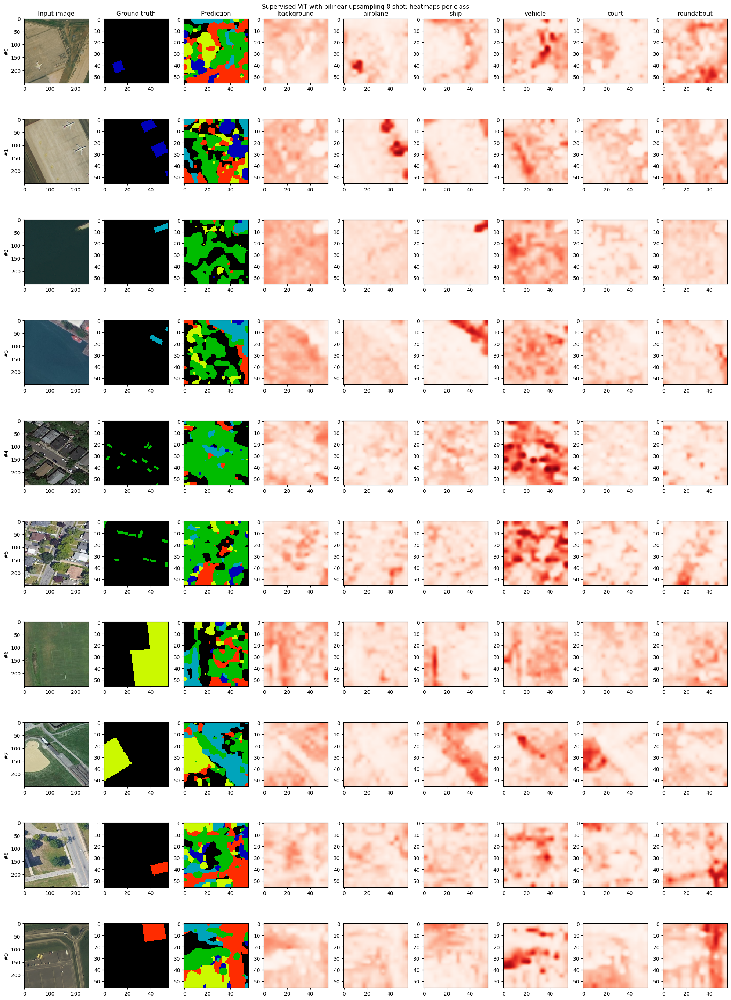

In [54]:
num_images = 10
# offset = n
num_classes = 6

fig, ax = plt.subplots(num_images, 3+6, figsize=(20, 28))
fig.suptitle('Supervised ViT with bilinear upsampling 8 shot: heatmaps per class')
ax[0,0].title.set_text("Input image")
ax[0,1].title.set_text("Ground truth")
ax[0,2].title.set_text("Prediction")
for l in range(num_classes):
    ax[0,l+3].title.set_text(f"{names[l]}")
for i, j in enumerate(range(2, 40, 4)):
    
    ax[i,0].set_ylabel(f"#{i}")
    ax[i,0].imshow(np.array(Image.open(path + images[j])))
    ax[i,1].imshow(labels_val[j].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    ax[i,2].imshow(predictions_val[j].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    for l in range(num_classes):
        ax[i,l+3].imshow(dist[j][:,l].reshape((56,56)), cmap='Reds', vmin=0, vmax=1)
        
n += 5
fig.tight_layout()

In [55]:
embs = activation(ebeds_val)

In [56]:
def iou(class_number):
    for threshold in tqdm([0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9]):
        airplane = torch.zeros(embs[:, :, class_number].shape)  
        airplane[embs[:, :, class_number] > threshold] = class_number
        ious = np.zeros(airplane.shape[0]) 
        for i in range(airplane.shape[0]):
            intersection = torch.logical_and(airplane[i], labels_val[i])
            union = torch.logical_or(airplane[i], labels_val[i])
            iou_score = torch.sum(intersection) / torch.sum(union)
            ious[i] = iou_score
        print(ious[ious>0].mean(), sep='\t')
        
        
for class_number in range(1, 6):
    print('class:', class_number, names[class_number])
    iou(class_number)

class: 1 airplane


  0%|          | 0/13 [00:00<?, ?it/s]

0.2798204629992445
0.35743473571809853
0.3716673377435654
0.43030042995815165
0.39550521736964583
0.42132848288331715
0.37781163517917904
0.3178137423736708
0.2354270342205252
0.17027198949030467
0.10439634203378644
0.03612738508187855
0.015470559854293242
class: 2 ship


  0%|          | 0/13 [00:00<?, ?it/s]

0.14094872871198907
0.1724636817317722
0.19656989697573912
0.1879250710720525
0.19484666555321642
0.20055511353226999
0.2159085367909736
0.21737520262831822
0.3179165815236047
0.3139695366844535
0.15454928757390007
0.0479704812169075
nan
class: 3 vehicle


/tmp/ipykernel_55309/2909574232.py:11: RuntimeWarning: Mean of empty slice.
  print(ious[ious>0].mean(), sep='\t')
/home/hkhachatrian/mae/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


  0%|          | 0/13 [00:00<?, ?it/s]

0.06757689849644735
0.06587831393980811
0.07094882691658481
0.08084752798701327
0.09647257795413247
0.12031495465069181
0.12562217694871566
0.1259255069307983
0.12184308913043317
0.12605008333921433
0.12278016796335578
0.1144849597942084
0.09954812657088041
class: 4 court


  0%|          | 0/13 [00:00<?, ?it/s]

0.15895723827326527
0.148595905280672
0.14737465209327638
0.13658702009706758
0.13775069192051886
0.0996526941889897
0.08684722380712628
0.0795993513893336
0.036563072353601456
0.018281536176800728
0.007312614470720291
nan
nan
class: 5 roundabout


  0%|          | 0/13 [00:00<?, ?it/s]

0.1164932906823723
0.1312593999189428
0.1674449906218797
0.16933467294438742
0.208909934485564
0.19768895677083897
0.1880731163546443
0.139629297756723
0.11273252731189132
0.10225213877856731
0.05529838893562555
0.047337278723716736
nan


In [64]:
def get_model(deconv=True, upsample=False):

    model_dino = get_dino_model()
    
    encoder = Encoder(model=model_dino, num_classes=5, backbone_freeze=True, 
                      model_name='dino', emb_size=768, deconvolution=deconv,
                      bilinear_upsampling=upsample, out_size=128)
    return encoder.to('cuda')

model_dino = get_model(deconv=True, upsample=True)

Loading dino model


Using cache found in /home/hkhachatrian/.cache/torch/hub/facebookresearch_dino_main


Bilinear upsampling and convolutional block


In [65]:
ckpt = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/f1m_250_dino_bilin_conv_8shot_128/epoch=399.ckpt')
# ckpt = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/f1m_250_dino_bilinear_upsampling_8shot/epoch=299-v1.ckpt')
# ckpt = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/cs_dino_bilinear_upsampling_img_test/epoch=39.ckpt')
# ckpt = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/cs_256_dino_bilinear_upsampling/epoch=299.ckpt')

In [66]:
keys = [i for i in model_dino.state_dict().keys()]

od = OrderedDict()

for key_chpt, key_model in zip(ckpt['state_dict'].keys(), keys):
    if key_model == key_chpt[10:]:
        od[key_model] = ckpt['state_dict'][key_chpt]
    else:
        print(key_model, key_chpt, sep='\t')

# od['a'] = 5
dino = model_dino.load_state_dict(od, strict=False)

In [67]:
dino

<All keys matched successfully>

In [68]:
model_dino.eval()

Encoder(
  (model): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
      (1): Block(
        (norm1): La

In [10]:
path = f'/mnt/lwll/lwll-coral/FAIR1M/fair1m_1000/{crop}_8shot/train/images/'
ebeds = []
predictions = []
labels = []
images = []
for ds in tqdm(dataloader, total=len(dataloader)):
    img = torch.einsum('nhwc->nchw', ds['image'])
    img_enc = model_dino(img.float().to('cuda'))
    ebeds.append(img_enc.to('cpu'))
    labels.append(ds['patch_56x56'])
    predictions.append(activation(img_enc).argmax(dim=-1))
    images.extend(ds['file_name'])
    
    
predictions, labels = torch.cat(predictions, dim=0).cpu(), torch.cat(labels, dim=0).cpu()

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.96s/it]


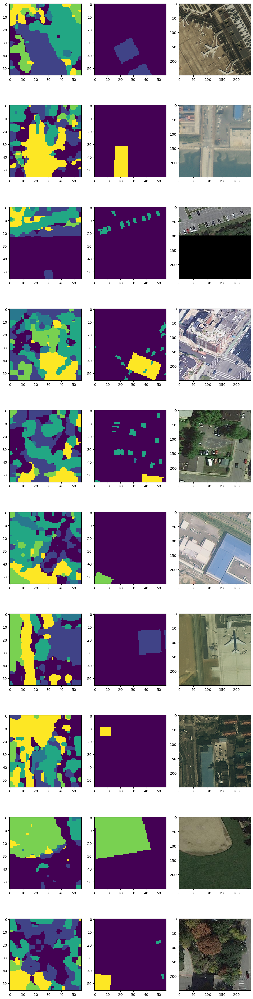

In [11]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 40))
for i in range(10):
    axes[i][0].imshow(predictions[i].reshape(56, 56), vmin=0, vmax=num_classes)
    axes[i][1].imshow(labels[i].reshape(56, 56), vmin=0, vmax=num_classes);
    axes[i][2].imshow(np.array(Image.open(path + images[i])), vmin=0, vmax=num_classes);
plt.tight_layout()

In [69]:
path = f'/mnt/lwll/lwll-coral/FAIR1M/fair1m_1000/{crop}_8shot/val/images/'

ebeds_val = []
predictions_val = []
labels_val = []
images = []
for ds in tqdm(dataloader_val, total=len(dataloader_val)):
    img = torch.einsum('nhwc->nchw', ds['image'])
    img_enc = model_dino(img.float().to('cuda'))
    ebeds_val.append(img_enc.to('cpu'))
    img_enc = img_enc.detach().cpu()
    labels_val.append(ds['patch_56x56'])
    predictions_val.append(activation(img_enc).argmax(dim=-1).detach().cpu())
    images.extend(ds['file_name'])
    
predictions_val, labels_val = torch.cat(predictions_val, dim=0).cpu(), torch.cat(labels_val, dim=0).cpu()

  0%|          | 0/2 [00:00<?, ?it/s]

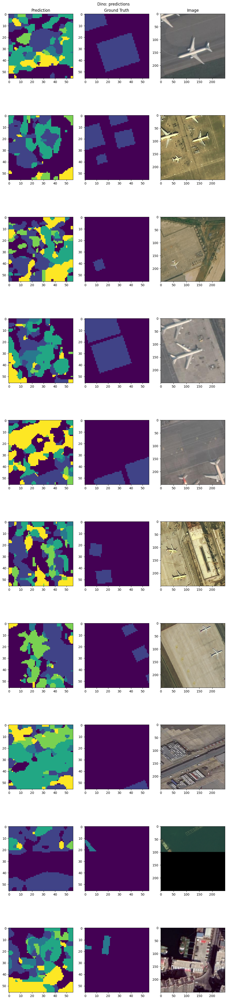

In [13]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 45))
plt.suptitle('Dino: predictions')
axes[0][0].set_title('Prediction')
axes[0][1].set_title('Ground Truth')
axes[0][2].set_title('Image')
for i in range(10):
    axes[i][0].imshow(predictions_val[i].reshape(56, 56), vmin=0, vmax=num_classes)
    axes[i][1].imshow(labels_val[i].reshape(56, 56), vmin=0, vmax=num_classes);
    axes[i][2].imshow(np.array(Image.open(path + images[i])), vmin=0, vmax=num_classes);
plt.tight_layout()

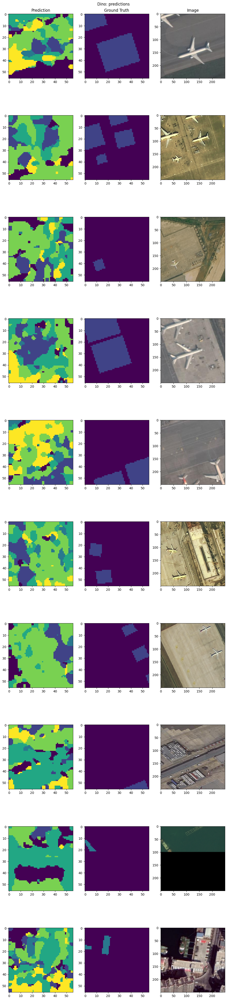

In [16]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 45))
plt.suptitle('Dino: predictions')
axes[0][0].set_title('Prediction')
axes[0][1].set_title('Ground Truth')
axes[0][2].set_title('Image')
for i in range(10):
    axes[i][0].imshow(predictions_val[i].reshape(56, 56), vmin=0, vmax=num_classes)
    axes[i][1].imshow(labels_val[i].reshape(56, 56), vmin=0, vmax=num_classes);
    axes[i][2].imshow(np.array(Image.open(path + images[i])), vmin=0, vmax=num_classes);
plt.tight_layout()

In [70]:
ebeds_val = torch.cat(ebeds_val, dim=0)

In [71]:
dist = activation(ebeds_val).detach().numpy()#.reshape(-1, 6)

In [72]:
dist[0][:, 1].shape

(3136,)

In [73]:
# 'background', 'airplane', 'ship', 'vehicle', 'court', 'roundabout'
names = {
    0: 'background',
    1: 'airplane',
    2: 'ship',
    3: 'vehicle',
    4: 'court',
    5: 'roundabout'
}

In [74]:
n = j = 0

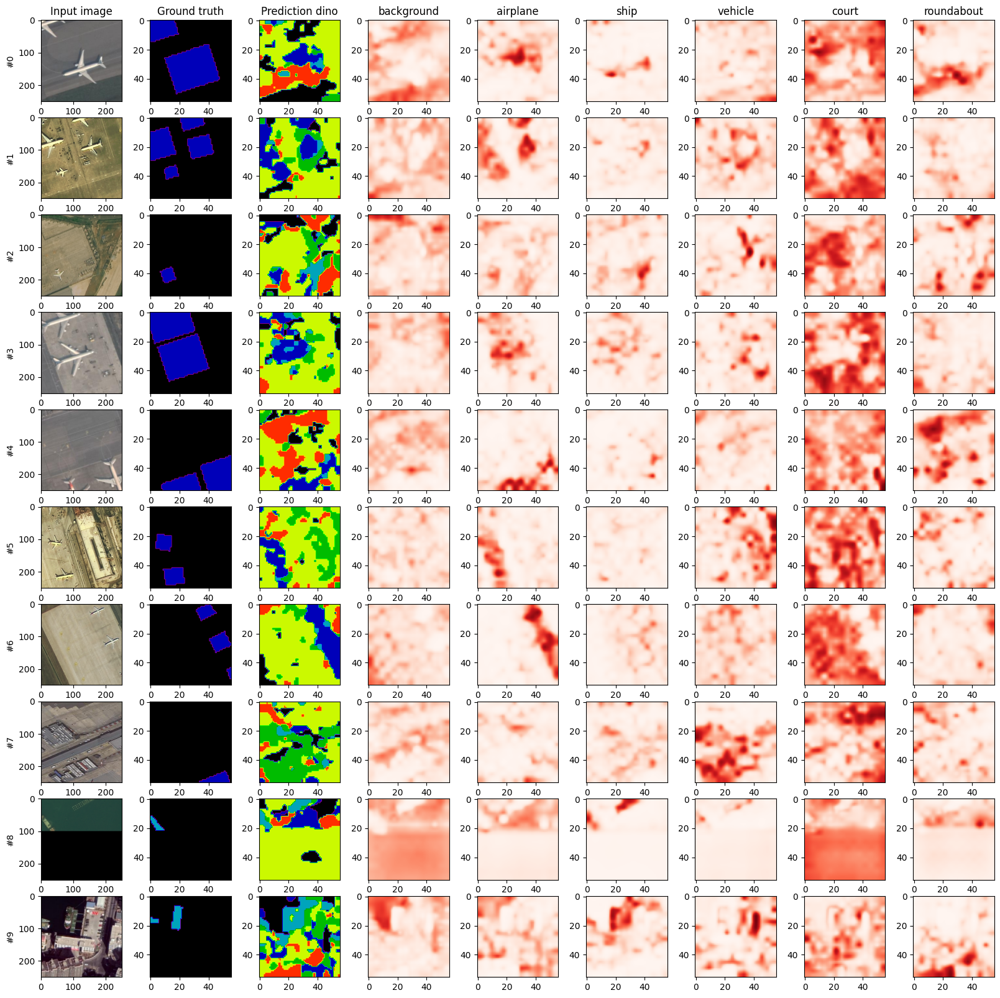

In [75]:
num_images = 10
offset = n
num_classes = 6

fig, ax = plt.subplots(num_images, 3+6, figsize=(20, 20))
# plt.suptitle('Dino: heatmaps per class')
ax[0,0].title.set_text("Input image")
ax[0,1].title.set_text("Ground truth")
ax[0,2].title.set_text("Prediction dino")
for l in range(num_classes):
    ax[0,l+3].title.set_text(f"{names[l]}")
for i in range(offset, num_images + offset):
    
    ax[i-offset,0].set_ylabel(f"#{i}")
    ax[i-offset,0].imshow(np.array(Image.open(path + images[i])))
    ax[i-offset,1].imshow(labels_val[i].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    ax[i-offset,2].imshow(predictions_val[i].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    for l in range(num_classes):
        ax[i-offset,l+3].imshow(dist[i][:,l].reshape((56,56)), cmap='Reds', vmin=0, vmax=1)
        
n += 5

In [76]:
embs = activation(ebeds_val)

In [21]:
(embs[:, :, 1] > 0.5).shape

torch.Size([40, 3136])

In [22]:
airplane = torch.zeros(embs[:, :, 1].shape)
airplane[embs[:, :, 1] > 0.3] = 1

In [78]:
def iou(class_number):
    for threshold in tqdm([0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9]):
        airplane = torch.zeros(embs[:, :, class_number].shape)  
        airplane[embs[:, :, class_number] > threshold] = class_number
        ious = np.zeros(airplane.shape[0]) 
        for i in range(airplane.shape[0]):
            intersection = torch.logical_and(airplane[i], labels_val[i])
            union = torch.logical_or(airplane[i], labels_val[i])
            iou_score = torch.sum(intersection) / torch.sum(union)
            ious[i] = iou_score
        print(ious[ious>0].mean(), sep='\t')
        
        
for class_number in range(1, 6):
    print('class:', class_number, names[class_number])
    iou(class_number)

class: 1 airplane


  0%|          | 0/13 [00:00<?, ?it/s]

0.13771016484921952
0.17377780706566923
0.17750313704212506
0.1463824118177096
0.12959482254726545
0.12342014541112196
0.11975468513555824
0.14708240875708206
0.13471572721997896
0.09994859807193279
0.0678168289984266
0.036420582048594954
0.01405372575391084
class: 2 ship


  0%|          | 0/13 [00:00<?, ?it/s]

0.1325413855675865
0.13557982896096432
0.13464057146726796
0.14850715763474764
0.14430949424037381
0.14507703931691746
0.15805010012506196
0.16974852811545132
0.18307884082605597
0.1891704338153691
0.21077880379743874
0.13899253795389085
0.1144301372114569
class: 3 vehicle


  0%|          | 0/13 [00:00<?, ?it/s]

0.08579345380492283
0.08607371248945128
0.09244222283877175
0.09915768628491571
0.10310334341678147
0.11853677920880727
0.1209252641511787
0.1253255034029922
0.12626123072889944
0.12708198888084063
0.11051537193865939
0.1074489641468972
0.08823489863425493
class: 4 court


  0%|          | 0/13 [00:00<?, ?it/s]

0.09638834063994832
0.09793676107159734
0.09732274990705209
0.10014070306594174
0.09265652160031786
0.10700298952060225
0.10422538732555472
0.0979277594247833
0.10938884379164152
0.1272758998675272
0.12125719850882888
0.13547651304785782
0.07991111055016517
class: 5 roundabout


  0%|          | 0/13 [00:00<?, ?it/s]

0.11887354196342467
0.11781853401102126
0.12368736268994822
0.13128800097681387
0.13158912425312927
0.13782774450789606
0.1447706799954176
0.1260095558721911
0.12545732245780528
0.13683410140220076
0.1099202417244669
0.09822086927791436
0.058603452634997666


In [129]:
ious = np.zeros(airplane.shape[0]) 
for i in tqdm(range(airplane.shape[0])):
    intersection = torch.logical_and(airplane[i], labels_val[i])
    union = torch.logical_or(airplane[i], labels_val[i])
    iou_score = torch.sum(intersection) / torch.sum(union)
    ious[i] = iou_score

100%|█████████████████████████████████████████████████████████████████████████████████████████| 80/80 [00:00<00:00, 18586.62it/s]


In [130]:
ious.

array([0.21266541, 0.56778526, 0.29133859, 0.28764939, 0.32958201,
       0.67801857, 0.62318838, 0.03174603, 0.60526317, 0.22270742,
       0.0221519 , 0.31914893, 0.27272728, 0.        , 0.25429553,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01851852, 0.        , 0.0449827 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01921708, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.01226492, 0.        , 0.        , 0.00581395,
       0.        , 0.        , 0.        , 0.37815127, 0.        ,
       0.        , 0.        , 0.        , 0.0015674 , 0.     

In [126]:
airplane.shape

torch.Size([80, 3136])

In [111]:
i = 0

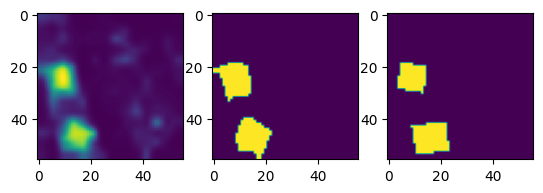

In [123]:
i += 1
fix, axes = plt.subplots(nrows=1, ncols=3)
axes[0].imshow(dist[i][:, 1].reshape(56, 56))
axes[1].imshow(airplane[i].reshape(56, 56))
axes[2].imshow(labels_val[i].reshape(56, 56));

In [124]:
intersection = torch.logical_and(airplane[i], labels_val[i])
union = torch.logical_or(airplane[i], labels_val[i])
iou_score = torch.sum(intersection) / torch.sum(union)
iou_score

tensor(0.6780)

In [101]:
i=11

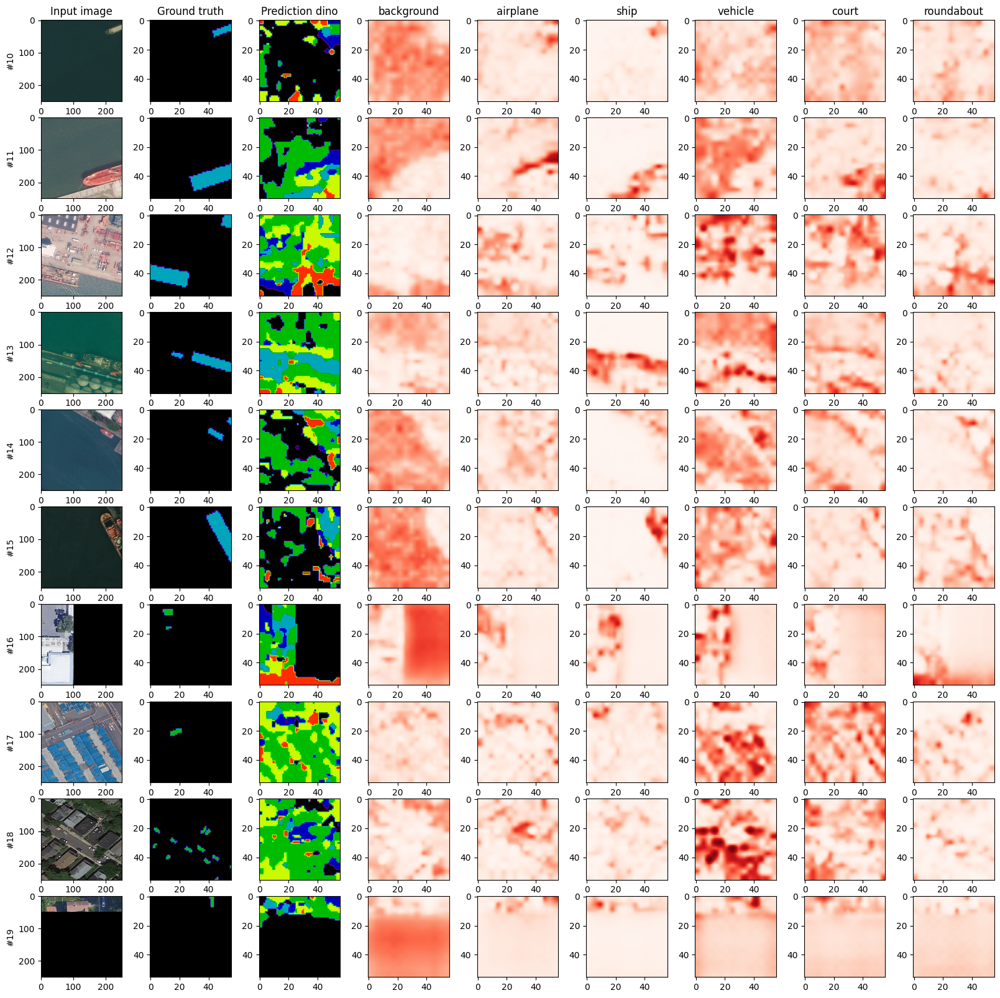

In [77]:
num_images = 10
offset = n
num_classes = 6

fig, ax = plt.subplots(num_images, 3+6, figsize=(20, 20))
# plt.suptitle('Dino: heatmaps per class')
ax[0,0].title.set_text("Input image")
ax[0,1].title.set_text("Ground truth")
ax[0,2].title.set_text("Prediction dino")
for l in range(num_classes):
    ax[0,l+3].title.set_text(f"{names[l]}")
for i in range(offset, num_images + offset):
    
    ax[i-offset,0].set_ylabel(f"#{i}")
    ax[i-offset,0].imshow(np.array(Image.open(path + images[i])))
    ax[i-offset,1].imshow(labels_val[i].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    ax[i-offset,2].imshow(predictions_val[i].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    for l in range(num_classes):
        ax[i-offset,l+3].imshow(dist[i][:,l].reshape((56,56)), cmap='Reds', vmin=0, vmax=1)
        
n += 5

In [21]:
from sklearn import metrics

cm = metrics.confusion_matrix(labels_val.reshape(-1), predictions_val.reshape(-1), labels=range(6))

In [22]:
cm

array([[26348,  7956,  6584, 31388, 31719,  9414],
       [  107,  2112,    96,  1229,   562,   162],
       [    3,    80,   609,   506,   253,    29],
       [    0,    15,    24,   590,    35,     6],
       [  609,   751,   109,   420,  2383,   181],
       [    8,   117,    50,   101,   312,   572]])

In [29]:
cm[1:, 1:]

array([[2112,   96, 1229,  562,  162],
       [  80,  609,  506,  253,   29],
       [  15,   24,  590,   35,    6],
       [ 751,  109,  420, 2383,  181],
       [ 117,   50,  101,  312,  572]])

In [24]:
model = 'dino'

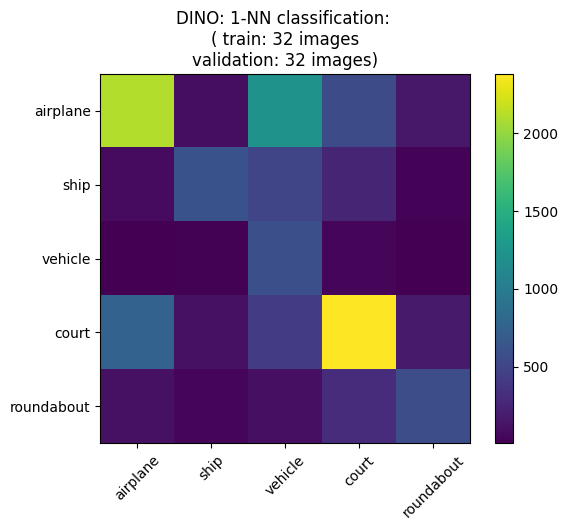

In [31]:
plt.figure()
plt.imshow(cm[1:, 1:])
plt.yticks(range(5), ['airplane', 'ship', 'vehicle', 'court', 'roundabout'])
plt.xticks(range(5), ['airplane', 'ship', 'vehicle', 'court', 'roundabout'], rotation=45)
plt.title(f"{model.upper()}: 1-NN classification: \n( train: 32 images\nvalidation: 32 images)")
plt.colorbar();

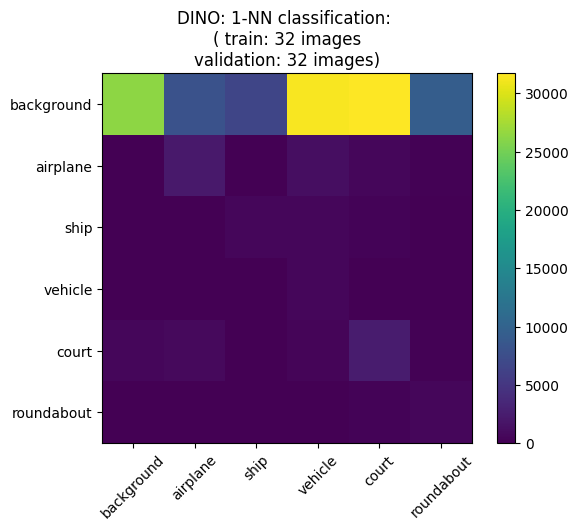

In [32]:
plt.figure()
plt.imshow(cm)
plt.yticks(range(6), ['background', 'airplane', 'ship', 'vehicle', 'court', 'roundabout'])
plt.xticks(range(6), ['background', 'airplane', 'ship', 'vehicle', 'court', 'roundabout'], rotation=45)
plt.title(f"{model.upper()}: 1-NN classification: \n( train: 32 images\nvalidation: 32 images)")
plt.colorbar();

In [10]:
ebeds_val = []
predictions_val = []
labels_val = []
images = []
for ds in tqdm(dataloader_val, total=len(dataloader_val)):
    img = torch.einsum('nhwc->nchw', ds['image'])
    img_enc = model_dino(img.float().to('cuda'))
    ebeds_val.append(img_enc.to('cpu'))
    img_enc = img_enc.detach().cpu()
    labels_val.append(ds['patch_dino'])
    predictions_val.append(activation(img_enc).argmax(dim=-1).detach().cpu())
    images.extend(ds['file_name'])
    
predictions_val, labels_val = torch.cat(predictions_val, dim=0).cpu(), torch.cat(labels_val, dim=0).cpu()

100%|███████████████████████████████████████████████████████████████████████████████████| 30/30 [00:31<00:00,  1.05s/it]


In [12]:
import matplotlib.pyplot as plt

import numpy as np
from PIL import Image

In [15]:
predictions_val.shape

torch.Size([960, 3136])

In [16]:
plt.imshow(labels_val[10].reshape(256, -1))

RuntimeError: shape '[256, -1]' is invalid for input of size 3136

In [13]:
import cv2
x = next(iter(dataloader_val))

In [14]:
black_image.shape

NameError: name 'black_image' is not defined

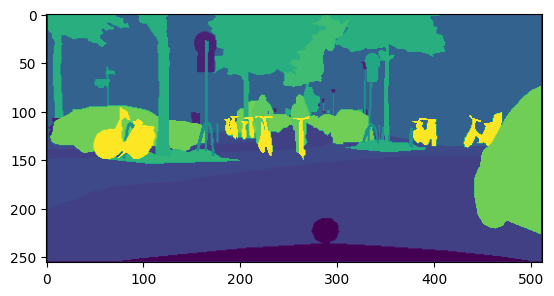

In [15]:
black_image = x['black_image'].squeeze(0).numpy()

plt.imshow(cv2.resize(black_image, (512, 256), interpolation=cv2.INTER_NEAREST_EXACT))

In [16]:
cv2.resize(black_image, (512, 256), interpolation=cv2.INTER_NEAREST_EXACT).shape

(256, 512)

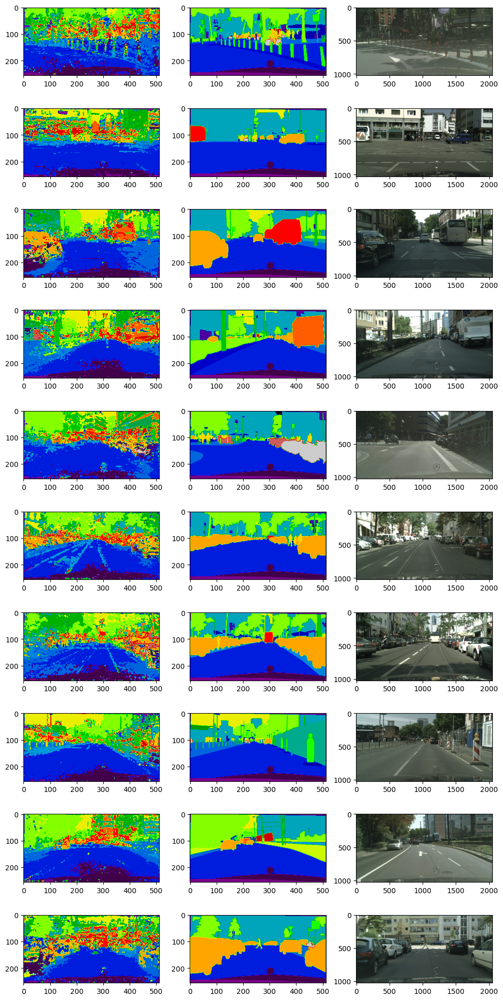

In [18]:
# path = f'/mnt/lwll/lwll-coral/FAIR1M/fair1m_1000/{crop}_8shot/val/images/'
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 20))
for i in range(10):
    axes[i][0].imshow(predictions_val[i+10].reshape(256, 512), vmin=0, vmax=num_classes, cmap='nipy_spectral')
    axes[i][1].imshow(labels_val[i+10].reshape(256, 512), vmin=0, vmax=num_classes, cmap='nipy_spectral');
    axes[i][2].imshow(np.array(Image.open(images[i+10])))
plt.tight_layout();

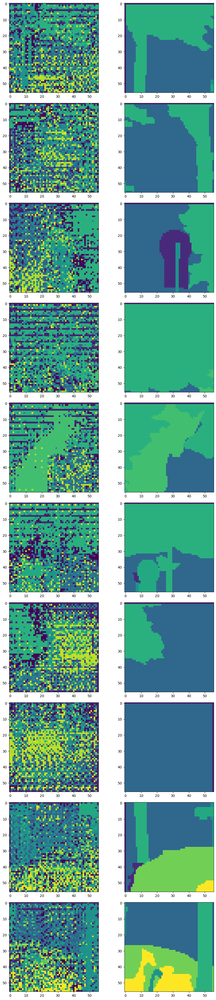

In [31]:
fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(10, 40))
for i in range(10):
    axes[i][0].imshow(predictions_val[i].reshape(56, 56), vmin=0, vmax=num_classes)
    axes[i][1].imshow(labels_val[i].reshape(56, 56), vmin=0, vmax=num_classes);
plt.tight_layout()

In [27]:
model_dino_up = get_model(deconv=False, upsample=True)


ckpt_up = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/cs_256_dino_bilinear_upsampling/epoch=99.ckpt')

Loading dino model


Using cache found in /home/hkhachatrian/.cache/torch/hub/facebookresearch_dino_main


In [28]:
keys = [i for i in model_dino_up.state_dict().keys()]

od = OrderedDict()

for key_chpt, key_model in zip(ckpt_up['state_dict'].keys(), keys):
    if key_model == key_chpt[10:]:
        od[key_model] = ckpt_up['state_dict'][key_chpt]
    else:
        print(key_model, key_chpt, dep='\t')

# od['a'] = 5
model_dino_up.load_state_dict(od, strict=False)

<All keys matched successfully>

In [29]:
model_dino_up.eval()

Encoder(
  (model): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
      (1): Block(
        (norm1): La

In [30]:
# ebeds_val = []
predictions_val_up = []
# images = []
# labels_val = []
for ds in tqdm(dataloader_val, total=len(dataloader_val)):
    img = torch.einsum('nhwc->nchw', ds['image'])
#     images.append(ds['image'])
    img_enc = model_dino_up(img.float().to('cuda'))
#     ebeds_val.append(img_enc.to('cpu'))
#     labels_val.append(ds['patch_56x56'])
    predictions_val_up.append(activation(img_enc).argmax(dim=-1).to('cpu'))

100%|██████████████████████████████████████████████████████| 48/48 [00:08<00:00,  5.65it/s]


In [31]:
img_enc.shape

torch.Size([20, 3136, 34])

In [46]:
images = torch.cat(images, dim=0)

In [32]:
predictions_val_up = torch.cat(predictions_val_up, dim=0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

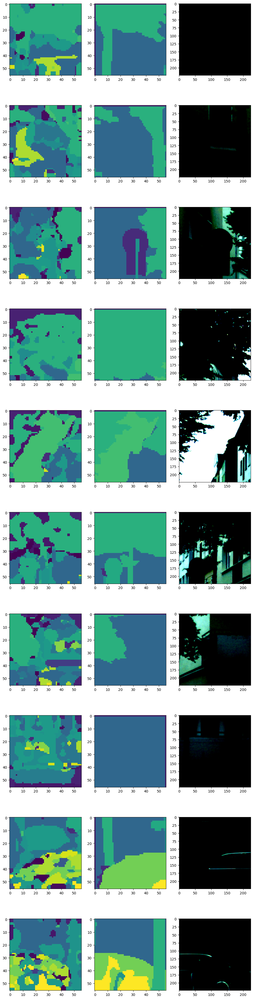

In [33]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 40))
for i in range(10):
    axes[i][0].imshow(predictions_val_up[i].reshape(56, 56), vmin=0, vmax=num_classes)
    axes[i][1].imshow(labels_val[i].reshape(56, 56), vmin=0, vmax=num_classes);
    axes[i][2].imshow(images[i]);
    
plt.tight_layout()

In [103]:
def get_model(model_name, emb_size):
    device = 'cuda'
    arch='mae_vit_large_patch16'
    model_mae = getattr(models_mae, arch)()

    chkpt_dir = '../mae_visualize_vit_large_ganloss.pth'
    checkpoint = torch.load(chkpt_dir, map_location=device)
    msg = model_mae.load_state_dict(checkpoint['model'], strict=False)
    print(msg)

    encoder = Encoder(model=model_mae, num_classes=5, backbone_freeze=True, 
                      model_name=model_name, emb_size=emb_size, deconvolution=True,
                      bilinear_upsampling=True, out_size=256)
    return encoder.to('cuda')

In [104]:
model = get_model('mae', 1024)

<All keys matched successfully>
Bilinear upsampling and convolutional block


In [105]:
chkp = torch.load('/mnt/lwll/lwll-coral/hrant/mae_checkpoints/f1m_250_mae_bilin_conv_8shot_256/epoch=399.ckpt')

In [106]:
keys = [i for i in model.state_dict().keys()]

od = OrderedDict()

for key_chpt, key_model in zip(chkp['state_dict'].keys(), keys):
    if key_model == key_chpt[10:]:
        od[key_model] = chkp['state_dict'][key_chpt]
    else:
        print(key_model, key_chpt, dep='\t')

# od['a'] = 5
model.load_state_dict(od, strict=False)

<All keys matched successfully>

In [107]:
model.eval()

Encoder(
  (model): MaskedAutoencoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1024, out_features=3072, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1024, out_features=1024, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=1024, out_features=4096, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=4096, out_features=1024, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
      (1): Block(
        (norm1): LayerNorm((1024,), eps=1e-06, element

In [108]:
embeds_val = []
predictions_val_up_mae = []
images = []
labels_val = []
for ds in tqdm(dataloader_val, total=len(dataloader_val)):
    img = torch.einsum('nhwc->nchw', ds['image'])
    images.extend(ds['file_name'])
    img_enc = model(img.float().to('cuda'))
    embeds_val.append(img_enc.to('cpu'))
    labels_val.append(ds['patch_56x56'])
    predictions_val_up_mae.append(activation(img_enc).argmax(dim=-1).detach().cpu())
    images.extend(ds['file_name'])
    
predictions_val_up_mae = torch.cat(predictions_val_up_mae, dim=0)
labels_val = torch.cat(labels_val, dim=0).cpu()
embeds_val = torch.cat(embeds_val, dim=0)
dist_mae = activation(ebeds_val).detach().numpy()

path = f'/mnt/lwll/lwll-coral/FAIR1M/fair1m_1000/{crop}_8shot/val/images/'

  0%|          | 0/2 [00:00<?, ?it/s]

In [109]:
embs = activation(embeds_val)
embs.shape

torch.Size([40, 3136, 6])

In [110]:
def iou(class_number):
    for threshold in tqdm([0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9]):
        airplane = torch.zeros(embs[:, :, class_number].shape)  
        airplane[embs[:, :, class_number] > threshold] = class_number
        ious = np.zeros(airplane.shape[0]) 
        for i in range(airplane.shape[0]):
            intersection = torch.logical_and(airplane[i], labels_val[i])
            union = torch.logical_or(airplane[i], labels_val[i])
            iou_score = torch.sum(intersection) / torch.sum(union)
            ious[i] = iou_score
        print(ious[ious>0].mean(), sep='\t')
    
        
for class_number in range(1, 6):
    print('class:', class_number, names[class_number])
    iou(class_number)

class: 1 airplane


  0%|          | 0/13 [00:00<?, ?it/s]

0.1874411551547902
0.21678287434458202
0.20809786599308538
0.22336234555890164
0.23795784736284986
0.26116850710688877
0.2821219466859475
0.3116601768082806
0.22703267747004116
0.1588221142689387
0.08082703500986099
0.05814106506295502
0.041756301652640104
class: 2 ship


  0%|          | 0/13 [00:00<?, ?it/s]

0.07382431754931099
0.0819732325975425
0.07661436272319407
0.09150538096825282
0.09189644269645214
0.015608875313773751
nan
nan
nan
nan
nan
nan
nan
class: 3 vehicle


/tmp/ipykernel_3127697/1792969238.py:11: RuntimeWarning: Mean of empty slice.
  print(ious[ious>0].mean(), sep='\t')


  0%|          | 0/13 [00:00<?, ?it/s]

0.07466462425913455
0.04954567052690046
0.040387007574151666
0.029537753108888863
0.016942124697379768
0.014770291280001402
0.010204081423580647
nan
nan
nan
nan
nan
nan
class: 4 court


  0%|          | 0/13 [00:00<?, ?it/s]

0.1495983360800892
0.1776526782196015
0.17563632130622864
0.12293449292580287
0.07691193465143442
0.03872669534757733
0.0036563072353601456
nan
nan
nan
nan
nan
nan
class: 5 roundabout


  0%|          | 0/13 [00:00<?, ?it/s]

0.09236375922497747
0.08163692626112606
0.08123482936273584
0.07685791840776801
0.07969269808381796
0.09641434663949026
0.1434375538956374
0.10064365916574995
0.09025962953455746
0.08486206643283367
0.09041095525026321
0.003401360474526882
nan


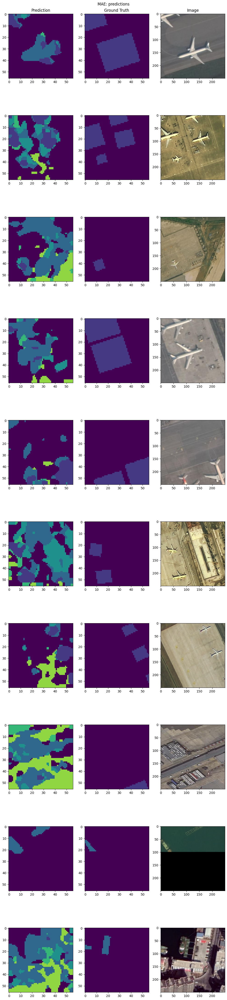

In [98]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 45))
plt.suptitle('MAE: predictions')
axes[0][0].set_title('Prediction')
axes[0][1].set_title('Ground Truth')
axes[0][2].set_title('Image')
for i in range(10):
    axes[i][0].imshow(predictions_val_up_mae[i].reshape(56, 56), vmin=0, vmax=num_classes)
    axes[i][1].imshow(labels_val[i].reshape(56, 56), vmin=0, vmax=num_classes);
    axes[i][2].imshow(np.array(Image.open(path + images[i])), vmin=0, vmax=num_classes);
plt.tight_layout()

In [106]:
len(images)

80

In [107]:
labels_val.shape

torch.Size([40, 3136])

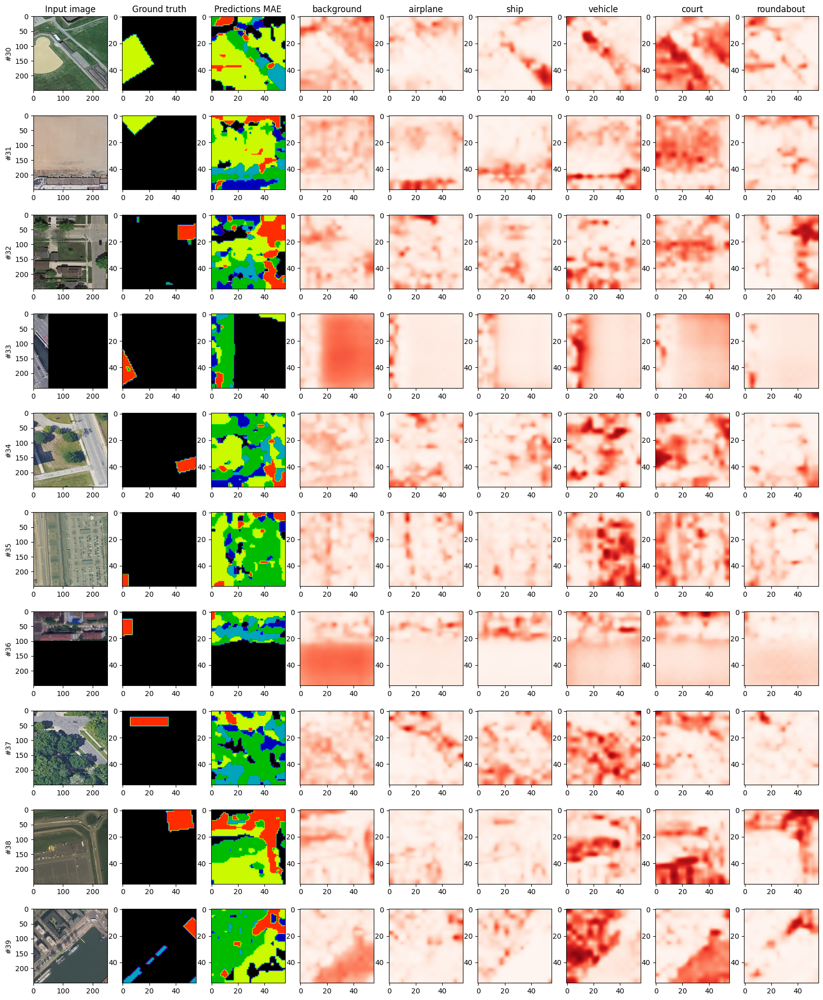

In [109]:
num_images = 10
offset = 30
num_classes = 6

fig, ax = plt.subplots(num_images, 3+6, figsize=(20, 25))
# plt.suptitle('MAE: heatmaps per class')
ax[0,0].title.set_text("Input image")
ax[0,1].title.set_text("Ground truth")
ax[0,2].title.set_text("Predictions MAE")
for l in range(num_classes):
    ax[0,l+3].title.set_text(f"{names[l]}")
for i in range(offset, num_images + offset):
    
    ax[i-offset,0].set_ylabel(f"#{i}")
    ax[i-offset,0].imshow(np.array(Image.open(path + images[i+20])))
    ax[i-offset,1].imshow(labels_val[i].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    ax[i-offset,2].imshow(predictions_val[i].reshape(56, 56), cmap='nipy_spectral', vmin=0, vmax=6)
    for l in range(num_classes):
        ax[i-offset,l+3].imshow(dist[i][:,l].reshape((56,56)), cmap='Reds', vmin=0, vmax=1)

In [15]:
annots = np.load(annotation_val, allow_pickle=True).item()

In [16]:
annots = np.load(annotation_val, allow_pickle=True).item()

for i, preds in enumerate(predictions_val_up_mae):
    annots['images'][i]['patch_labels_gt'] = annots['images'][i]['patch_labels']
    annots['images'][i]['patch_labels'] = preds.detach().numpy()
    
np.save('../annotations/cs_256_mae_bil_ups_lr_1e4_499_pred.npy', annots)

In [17]:
np.save('../annotations/cs_256_mae_bil_ups_lr_1e4_499_pred.npy', annots)

In [60]:
predictions_val_up_mae.shape

torch.Size([960, 3136])

In [51]:
labels_val = torch.cat(labels_val, dim=0)

In [ ]:
images = torch.cat(images, dim=0)

In [36]:
import matplotlib.pyplot as plt

In [47]:
from PIL import Image

In [53]:
import numpy as np

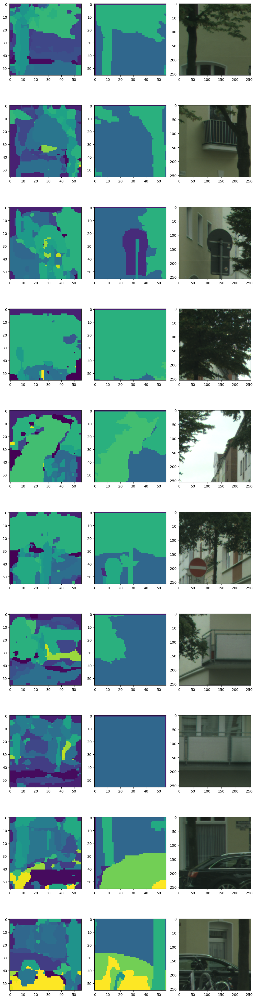

In [54]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 40))
for i in range(10):
    axes[i][0].imshow(predictions_val_up_mae[i].reshape(56, 56), vmin=0, vmax=num_classes)
    axes[i][1].imshow(labels_val[i].reshape(56, 56), vmin=0, vmax=num_classes);
    axes[i][2].imshow(np.array(Image.open(images[i])));
    
plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

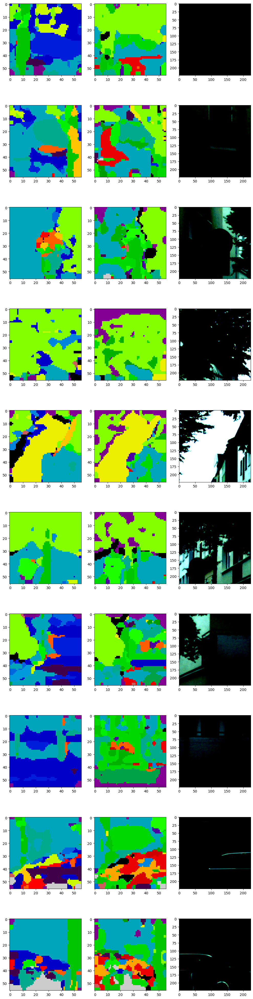

In [35]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(10, 40))

for i in range(10):
    axes[i][0].imshow(predictions_val_up_mae[i].reshape(56, 56), vmin=0, vmax=num_classes, cmap='nipy_spectral')
    axes[i][1].imshow(predictions_val_up[i].reshape(56, 56), vmin=0, vmax=num_classes, cmap='nipy_spectral');
    axes[i][2].imshow(images[i]);
    
plt.tight_layout()

In [39]:
new_keys = []
for i in chkp['state_dict']:
    print(i[10:])
    new_keys.append(i[10:])

model.cls_token
model.pos_embed
model.mask_token
model.decoder_pos_embed
model.patch_embed.proj.weight
model.patch_embed.proj.bias
model.blocks.0.norm1.weight
model.blocks.0.norm1.bias
model.blocks.0.attn.qkv.weight
model.blocks.0.attn.qkv.bias
model.blocks.0.attn.proj.weight
model.blocks.0.attn.proj.bias
model.blocks.0.norm2.weight
model.blocks.0.norm2.bias
model.blocks.0.mlp.fc1.weight
model.blocks.0.mlp.fc1.bias
model.blocks.0.mlp.fc2.weight
model.blocks.0.mlp.fc2.bias
model.blocks.1.norm1.weight
model.blocks.1.norm1.bias
model.blocks.1.attn.qkv.weight
model.blocks.1.attn.qkv.bias
model.blocks.1.attn.proj.weight
model.blocks.1.attn.proj.bias
model.blocks.1.norm2.weight
model.blocks.1.norm2.bias
model.blocks.1.mlp.fc1.weight
model.blocks.1.mlp.fc1.bias
model.blocks.1.mlp.fc2.weight
model.blocks.1.mlp.fc2.bias
model.blocks.2.norm1.weight
model.blocks.2.norm1.bias
model.blocks.2.attn.qkv.weight
model.blocks.2.attn.qkv.bias
model.blocks.2.attn.proj.weight
model.blocks.2.attn.proj.bias
m

In [113]:
crop, model, epoch, suffix = 256, 'mae', 399, '_bilin_conv_1024'
# pred_annots = np.load(f'../annotations/eval_cs4pc_joined_{crop}_{model}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)
pred_annots = np.load(f'../annotations/eval_cs4pc_{model}_joined_{crop}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)

In [117]:
crop, model, epoch, suffix = 256, 'mae', 379, '_bilin_conv_512'
# pred_annots = np.load(f'../annotations/eval_cs4pc_joined_{crop}_{model}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)
pred_512 = np.load(f'../annotations/eval_cs4pc_{model}_joined_{crop}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)

In [118]:
crop, model, epoch, suffix = 256, 'mae', 194, '_bilin_conv_256'
# pred_annots = np.load(f'../annotations/eval_cs4pc_joined_{crop}_{model}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)
pred_256 = np.load(f'../annotations/eval_cs4pc_{model}_joined_{crop}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)

In [119]:
crop, model, epoch, suffix = 256, 'mae', 244, '_bilin_conv_128'
# pred_annots = np.load(f'../annotations/eval_cs4pc_joined_{crop}_{model}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)
pred_128 = np.load(f'../annotations/eval_cs4pc_{model}_joined_{crop}_val{suffix}_epoch_{epoch}.npy', allow_pickle=True)

In [3]:
crop, model, suffix = 256, 'dino', '_val_pred_gmm'
pred_annots = np.load(f'../annotations/eval_cs4pc_{model}_joined_{crop}{suffix}.npy', allow_pickle=True)

In [55]:
ll ../annotations/ | grep eval_cs4pc_joined_

-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 13:20 eval_cs4pc_joined_256_val_bil_usp_lr_1e2_epoch_199.npy
-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 13:41 eval_cs4pc_joined_256_val_bil_usp_lr_1e2_epoch_59.npy
-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 13:37 eval_cs4pc_joined_256_val_bil_usp_lr_1e2_epoch_99.npy
-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 13:19 eval_cs4pc_joined_256_val_bil_usp_lr_1e3_epoch_199.npy
-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 13:27 eval_cs4pc_joined_256_val_bil_usp_lr_1e3_epoch_299.npy
-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 13:31 eval_cs4pc_joined_256_val_bil_usp_lr_1e3_epoch_399.npy
-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 13:35 eval_cs4pc_joined_256_val_bil_usp_lr_1e3_epoch_499.npy
-rw-rw-r-- 1 hkhachatrian    629162108 Apr  3 12:40 eval_cs4pc_joined_256_val_bil_usp_lr_1e4_epoch_499.npy


In [96]:
pred_annots[0]#['black_image'].shape

{'file_name': '/mnt/lwll/lwll-coral/hrant/leftImg8bit/val/munster/munster_000097_000019_leftImg8bit.png',
 'id': 0,
 'patch_labels': array([[19., 19., 19., ..., 10., 10., 10.],
        [19., 19., 19., ..., 10., 10., 10.],
        [19., 19., 19., ..., 10., 10., 10.],
        ...,
        [ 1.,  1.,  1., ...,  5.,  5.,  5.],
        [ 1.,  1.,  1., ...,  5.,  5.,  5.],
        [ 1.,  1.,  1., ...,  5.,  5.,  5.]]),
 'resized_img': array([[21, 21, 21, ..., 11, 11, 11],
        [21, 21, 21, ..., 11, 11, 11],
        [21, 21, 21, ..., 11, 11, 11],
        ...,
        [ 7,  7,  7, ...,  7,  7,  7],
        [ 7,  7,  7, ...,  7,  7,  7],
        [ 7,  7,  7, ...,  7,  7,  7]], dtype=uint8),
 'black_image': array([[3, 3, 3, ..., 3, 3, 3],
        [3, 3, 3, ..., 3, 3, 3],
        [3, 3, 3, ..., 3, 3, 3],
        ...,
        [3, 3, 3, ..., 3, 3, 3],
        [3, 3, 3, ..., 3, 3, 3],
        [3, 3, 3, ..., 3, 3, 3]], dtype=uint8),
 'patch_labels_14x14': array([[21, 21, 11, 11, 11, 21, 21, 21, 23

In [4]:
import matplotlib.pyplot as plt

In [12]:
%matplotlib inline

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(9, 6))
plt.suptitle(f'{model.capitalize()} predictions with IoU = 0.160355')
axes[0][1].set_title('Ground truth')
axes[0][0].set_title('Prediction')
axes[0][2].set_title('Image')
for i in range(axes.shape[0]):
    axes[i][1].imshow(pred_annots[i]['black_image'])
    axes[i][0].imshow(pred_annots[i]['patch_labels'])
    axes[i][2].imshow(np.array(Image.open((pred_annots[i]['file_name']))))
    
    
plt.tight_layout()
# plt.show()

In [10]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(15, 35))
plt.suptitle(f'{model.capitalize()} predictions with IoU = 0.150210')
axes[0][0].set_title('Prediction')
axes[0][1].set_title('Ground truth')
axes[0][2].set_title('Image')
for i in range(axes.shape[0]):
    axes[i][0].imshow(pred_annots[i]['patch_labels'])
    axes[i][1].imshow(pred_annots[i]['black_image'])
    axes[i][2].imshow(np.array(Image.open((pred_annots[i]['file_name']))))
    
    
plt.tight_layout()
plt.show()

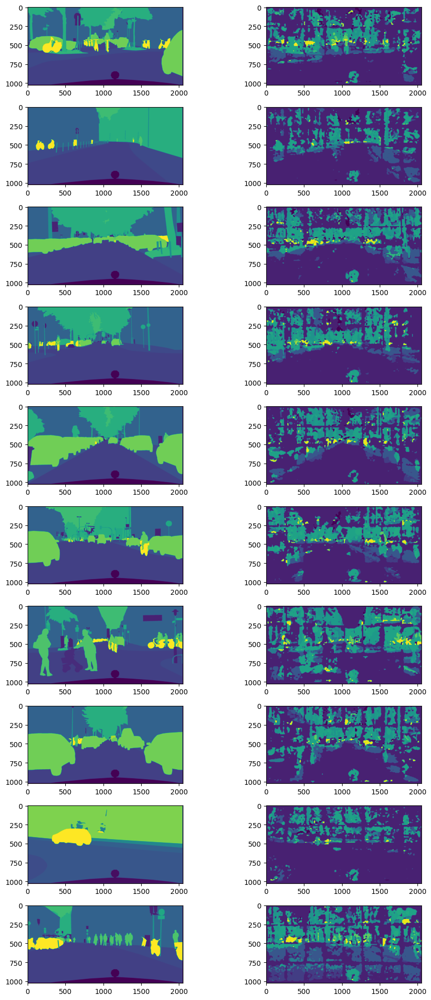

In [54]:


fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(10, 20))

for i in range(axes.shape[0]):
    axes[i][0].imshow(pred_annots[i]['black_image'])
    axes[i][1].imshow(pred_annots[i]['patch_labels'])
    
plt.tight_layout()
plt.show()

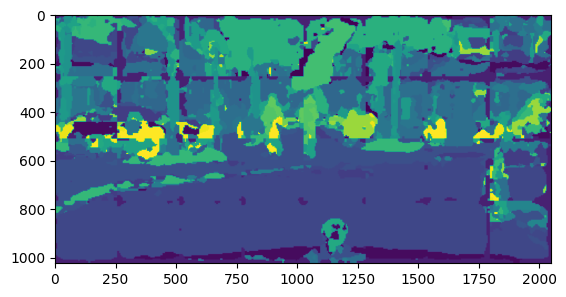

In [32]:
plt.imshow(pred_annots[0]['patch_labels']);

In [1]:
import numpy as np

In [3]:
x = np.load('../auc_preds_train.npy', allow_pickle=True)

In [4]:
x

array([{4: tensor(0.9201), 9: tensor(0.9240), 14: tensor(0.9233)},
       {4: tensor(0.8862), 9: tensor(0.9148), 14: tensor(0.9239)},
       {4: tensor(0.5930), 9: tensor(0.6790), 14: tensor(0.7438)}],
      dtype=object)

In [40]:
x = np.load('/mnt/lwll/lwll-coral/hrant/annotations/eval_cs4pc_joined_256_val_bil_usp_lr_1e4_epoch_499.npy', allow_pickle=True)

In [42]:
x

ValueError: can only convert an array of size 1 to a Python scalar